In [9]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.pyplot import *
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.graph_objs as go
from plotly.tools import FigureFactory as FF
import scipy

from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as plo

import plotly.express as px
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings('ignore')

In [11]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [12]:
ds=pd.read_excel("customer_retention_dataset.xlsx")
ds

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

# Exploratory data Analysis

In [13]:
ds.head()

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

In [16]:
ds.shape

(269, 71)

In [17]:
ds.columns

Index(['1Gender of respondent', '2 How old are you? ',
       '3 Which city do you shop online from?',
       '4 What is the Pin Code of where you shop online from?',
       '5 Since How Long You are Shopping Online ?',
       '6 How many times you have made an online purchase in the past 1 year?',
       '7 How do you access the internet while shopping on-line?',
       '8 Which device do you use to access the online shopping?',
       '9 What is the screen size of your mobile device?\t\t\t\t\t\t                                        ',
       '10 What is the operating system (OS) of your device?\t\t\t\t                                          ',
       '11 What browser do you run on your device to access the website?\t\t\t                                                          ',
       '12 Which channel did you follow to arrive at your favorite online store for the first time?                                                                   ',
       '13 After first visit, how 

In [18]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
 #   Column                                                                                                                                                                                                          Non-Null Count  Dtype 
---  ------                                                                                                                                                                                                          --------------  ----- 
 0   1Gender of respondent                                                                                                                                                                                           269 non-null    object
 1   2 How old are you?                                                                                                                                                                    

# To check missing values

In [19]:
ds.isnull()

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

In [20]:
ds.isnull().sum()

1Gender of respondent                                                                                                                                                                                                  0
2 How old are you?                                                                                                                                                                                                     0
3 Which city do you shop online from?                                                                                                                                                                                  0
4 What is the Pin Code of where you shop online from?                                                                                                                                                                  0
5 Since How Long You are Shopping Online ?                                                                                          

In [21]:
ds.shape

(269, 71)

In [22]:
ds['Quickness to complete purchase'].unique()

array(['Paytm.com', 'Amazon.com, Flipkart.com, Myntra.com',
       'Amazon.com, Paytm.com, Myntra.com',
       'Amazon.com, Flipkart.com, Paytm.com',
       'Amazon.com, Flipkart.com, Paytm.com, Myntra.com, Snapdeal',
       'Amazon.com', 'Flipkart.com, Myntra.com, Snapdeal',
       'Amazon.com, Flipkart.com', 'Flipkart.com'], dtype=object)

In [23]:
ds.values

array([['Male', '31-40 years', 'Delhi', ..., 'Amazon.in', 'Amazon.in',
        'Flipkart.com'],
       ['Female', '21-30 years', 'Delhi', ..., 'Myntra.com',
        'Amazon.in, Flipkart.com', 'Amazon.in, Myntra.com'],
       ['Female', '21-30 years', 'Greater Noida', ..., 'Paytm.com',
        'Amazon.in', 'Amazon.in, Paytm.com, Myntra.com'],
       ...,
       ['Female', '41-50 yaers', 'Bangalore ', ..., 'Snapdeal.com',
        'Amazon.in', 'Amazon.in'],
       ['Female', 'Less than 20 years', 'Solan', ...,
        'Myntra.com, Snapdeal.com', 'Myntra.com, Snapdeal.com',
        'Amazon.in'],
       ['Female', '41-50 yaers', 'Ghaziabad', ..., 'Amazon.in',
        'Amazon.in', 'Amazon.in']], dtype=object)

In [24]:
ds.duplicated()

0      False
1      False
2      False
3      False
4      False
5      False
6      False
7      False
8      False
9      False
10     False
11     False
12     False
13     False
14     False
15     False
16     False
17     False
18     False
19     False
20     False
21     False
22     False
23     False
24     False
25     False
26     False
27     False
28     False
29     False
30     False
31     False
32     False
33     False
34     False
35     False
36     False
37     False
38     False
39     False
40     False
41     False
42     False
43     False
44     False
45     False
46     False
47     False
48     False
49     False
50     False
51     False
52     False
53     False
54     False
55     False
56     False
57     False
58     False
59     False
60     False
61     False
62     False
63     False
64     False
65     False
66     False
67     False
68     False
69     False
70     False
71     False
72      True
73     False
74     False
75     False
76     False

In [25]:
dupli=ds.duplicated()
ds[dupli]

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

In [26]:
categorical_col,numeric_col=[],[]
for i in ds:
    if ds[i].dtype=='O':
        categorical_col.append(i)
    elif (ds[i].dtypes=='int64') | (ds[i].dtypes=='float64') | (ds[i].dtypes=='int32'):
        numeric_col.append(i)
    else: continue
print('>>> Total Number of Feature::', ds.shape[1])
print('>>> Number of categorical features::', len(categorical_col))
print('>>> Number of Numerical Feature::', len(numeric_col))

>>> Total Number of Feature:: 71
>>> Number of categorical features:: 70
>>> Number of Numerical Feature:: 1


We have 71 columns in the dataframe

In [27]:
df=pd.DataFrame(data=ds)
df

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

Till here we have imported the dataset.

In [28]:
df=df.rename({'1Gender of respondent':'gender',
              '2 How old are you? ':'how_old',
              '3 Which city do you shop online from?':'city',
              '4 What is the Pin Code of where you shop online from?':'city_pincode',
              '5 Since How Long You are Shopping Online ?':'time_period',
              '6 How many times you have made an online purchase in the past 1 year?':'no_purchase',
              '7 How do you access the internet while shopping on-line?':'internet',
              '8 Which device do you use to access the online shopping?':'device_used',
              '9 What is the screen size of your mobile device?\t\t\t\t\t\t                                        ':'ph_scr_size',
              '10 What is the operating system (OS) of your device?\t\t\t\t                                          ':'os_device',
              '11 What browser do you run on your device to access the website?\t\t\t                                                          ':'browser_used',
              '12 Which channel did you follow to arrive at your favorite online store for the first time?                                                                   ':'channel_follow',
              '13 After first visit, how do you reach the online retail store?\t\t\t\t                                                   ':'reach_the_store',
              '14 How much time do you explore the e- retail store before making a purchase decision?                                                                   ':'explore_time',
              '15 What is your preferred payment Option?\t\t\t\t\t                                                                                                                               ':'payment_option',
              '16 How 4 do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t                                                   ':'abandon',
              '17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t                                                                                                                                                       ': 'bag_abandon',
              '18 The content on the website must be easy to read and understand':'content',
              '19 Information on similar product to the one highlighted  is important for product comparison':'info_similar_pr',
              '20 Complete information on listed seller and product being offered is important for purchase decision.':'complt_info',
              '21 All relevant information on listed products must be stated clearly':'info_of_pr',
              '22 Ease of navigation in website':'ease_of_website',
              '23 Loading and processing speed':'load_speed',
              '24 User friendly Interface of the website':'user_fr_inter',
              '25 Convenient Payment methods':'con_payment',
              '26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time':'trust_transaction',
              '27 Empathy (readiness to assist with queries) towards the customers':'empathy',
              '28 Being able to guarantee the privacy of the customer':'gur_privacy',
              '29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)':'avail_communi',
              '30 Online shopping gives monetary benefit and discounts':'monetary_benefits',
              '31 Enjoyment is derived from shopping online':'enjoy_shoponline',
              '32 Shopping online is convenient and flexible':'convenient_flexible',
              '33 Return and replacement policy of the e-tailer is important for purchase decision':'return_policy',
              '34 Gaining access to loyalty programs is a benefit of shopping online':'access_loyalty',
              '35 Displaying quality Information on the website improves satisfaction of customers':'dis_qua_info',
              '36 User derive satisfaction while shopping on a good quality website or application':'user_satisf',
              '37 Net Benefit derived from shopping online can lead to users satisfaction':'net_benefit',
              '38 User satisfaction cannot exist without trust':'satisf_wo_trust',
              '39 Offering a wide variety of listed product in several category':'wide_variety',
              '40 Provision of complete and relevant product information':'provision_prd',
              '41 Monetary savings':'monetary_savings',
              '42 The Convenience of patronizing the online retailer':'conven_of_retailer',
              '43 Shopping on the website gives you the sense of adventure':'sense_of_advent',
              '44 Shopping on your preferred e-tailer enhances your social status':'enhance_status',
              '45 You feel gratification shopping on your favorite e-tailer':'feel_gratif',
              '46 Shopping on the website helps you fulfill certain roles':'fulfill_roles',
              '47 Getting value for money spent':'value_for_money',
              'From the following, tick any (or all) of the online retailers you have shopped from;                                                                           ':'re_shopped',
              'Easy to use website or application':'easy_use',
              'Visual appealing web-page layout':'visual_appeal',
              'Wild variety of product on offer':'variety_offer',
              'Complete, relevant description information of products':'relevent_desc',
              'Fast loading website speed of website and application':'fast_website',
              'Reliability of the website or application':'reli_website',
              'Quickness to complete purchase':'quick_purchase',
              'Availability of several payment options':'sev_payment',
              'Speedy order delivery ':'speedy_del',
              'Privacy of customers’ information':'priv_cust',
              'Security of customer financial information':'sec_fin_info',
              'Perceived Trustworthiness':'trustworth',
              'Presence of online assistance through multi-channel':'online_assistance',
              'Longer time to get logged in (promotion, sales period)':'long_time_log',
              'Longer time in displaying graphics and photos (promotion, sales period)':'lon_time_dis',
              'Late declaration of price (promotion, sales period)':'late_dec_pr',
              'Longer page loading time (promotion, sales period)':'long_load_time',
              'Limited mode of payment on most products (promotion, sales period)':'lim_pay_mode',
              'Longer delivery period':'long_del_per',
              'Change in website/Application design':'ch_webs_dsgn',
              'Frequent disruption when moving from one page to another':'freq_dist',
              'Website is as efficient as before':'eff_website',
              'Which of the Indian online retailer would you recommend to a friend?':'reco_frnd'
            

             },axis=1)

In [29]:
df.columns

Index(['gender', 'how_old', 'city', 'city_pincode', 'time_period',
       'no_purchase', 'internet', 'device_used', 'ph_scr_size', 'os_device',
       'browser_used', 'channel_follow', 'reach_the_store', 'explore_time',
       'payment_option',
       '16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t                                                   ',
       'bag_abandon', 'content', 'info_similar_pr', 'complt_info',
       'info_of_pr', 'ease_of_website', 'load_speed', 'user_fr_inter',
       'con_payment', 'trust_transaction', 'empathy', 'gur_privacy',
       'avail_communi', 'monetary_benefits', 'enjoy_shoponline',
       'convenient_flexible', 'return_policy', 'access_loyalty',
       'dis_qua_info', 'user_satisf', 'net_benefit', 'satisf_wo_trust',
       'wide_variety', 'provision_prd', 'monetary_savings',
       'conven_of_retailer', 'sense_of_advent', 'enhance_status',
       'feel_gratif', 'fulfill_roles

here we can see that we have changed the column names.

In [30]:
len(df.columns)

71

We have 71 columns in our dataframe.

In [31]:
df.reco_frnd

0                                           Flipkart.com
1                                  Amazon.in, Myntra.com
2                       Amazon.in, Paytm.com, Myntra.com
3                                Amazon.in, Flipkart.com
4                                  Amazon.in, Myntra.com
5                                   Amazon.in, Paytm.com
6      Flipkart.com, Paytm.com, Myntra.com, snapdeal.com
7                                              Amazon.in
8                                              Amazon.in
9                                           Flipkart.com
10                                             Amazon.in
11                               Amazon.in, Flipkart.com
12                   Amazon.in, Flipkart.com, Myntra.com
13                               Amazon.in, Flipkart.com
14                      Amazon.in, Paytm.com, Myntra.com
15                               Amazon.in, Flipkart.com
16                                 Amazon.in, Myntra.com
17                             

In [32]:
df.reco_frnd.unique()

array(['Flipkart.com', 'Amazon.in, Myntra.com',
       'Amazon.in, Paytm.com, Myntra.com', 'Amazon.in, Flipkart.com',
       'Amazon.in, Paytm.com',
       'Flipkart.com, Paytm.com, Myntra.com, snapdeal.com', 'Amazon.in',
       'Amazon.in, Flipkart.com, Myntra.com'], dtype=object)

In [45]:
ds

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

In [46]:
len(ds.columns)

71

In [47]:
df=pd.DataFrame(data=ds)
df

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

In [48]:
df.columns

Index(['1Gender of respondent', '2 How old are you? ',
       '3 Which city do you shop online from?',
       '4 What is the Pin Code of where you shop online from?',
       '5 Since How Long You are Shopping Online ?',
       '6 How many times you have made an online purchase in the past 1 year?',
       '7 How do you access the internet while shopping on-line?',
       '8 Which device do you use to access the online shopping?',
       '9 What is the screen size of your mobile device?\t\t\t\t\t\t                                        ',
       '10 What is the operating system (OS) of your device?\t\t\t\t                                          ',
       '11 What browser do you run on your device to access the website?\t\t\t                                                          ',
       '12 Which channel did you follow to arrive at your favorite online store for the first time?                                                                   ',
       '13 After first visit, how 

we can see the column names from the above code.

Firstly let's change the column names of the dataframe.

In [49]:
df=df.rename({'1Gender of respondent':'gender',
              '2 How old are you? ':'how_old',
              '3 Which city do you shop online from?':'city',
              '4 What is the Pin Code of where you shop online from?':'city_pincode',
              '5 Since How Long You are Shopping Online ?':'time_period',
              '6 How many times you have made an online purchase in the past 1 year?':'no_purchase',
              '7 How do you access the internet while shopping on-line?':'internet',
              '8 Which device do you use to access the online shopping?':'device_used',
              '9 What is the screen size of your mobile device?\t\t\t\t\t\t                                        ':'ph_scr_size',
              '10 What is the operating system (OS) of your device?\t\t\t\t                                          ':'os_device',
              '11 What browser do you run on your device to access the website?\t\t\t                                                          ':'browser_used',
              '12 Which channel did you follow to arrive at your favorite online store for the first time?                                                                   ':'channel_follow',
              '13 After first visit, how do you reach the online retail store?\t\t\t\t                                                   ':'reach_the_store',
              '14 How much time do you explore the e- retail store before making a purchase decision?                                                                   ':'explore_time',
              '15 What is your preferred payment Option?\t\t\t\t\t                                                                                                                               ':'payment_option',
              '16 How 4 do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t                                                   ':'abandon',
              '17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t                                                                                                                                                       ': 'bag_abandon',
              '18 The content on the website must be easy to read and understand':'content',
              '19 Information on similar product to the one highlighted  is important for product comparison':'info_similar_pr',
              '20 Complete information on listed seller and product being offered is important for purchase decision.':'complt_info',
              '21 All relevant information on listed products must be stated clearly':'info_of_pr',
              '22 Ease of navigation in website':'ease_of_website',
              '23 Loading and processing speed':'load_speed',
              '24 User friendly Interface of the website':'user_fr_inter',
              '25 Convenient Payment methods':'con_payment',
              '26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time':'trust_transaction',
              '27 Empathy (readiness to assist with queries) towards the customers':'empathy',
              '28 Being able to guarantee the privacy of the customer':'gur_privacy',
              '29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)':'avail_communi',
              '30 Online shopping gives monetary benefit and discounts':'monetary_benefits',
              '31 Enjoyment is derived from shopping online':'enjoy_shoponline',
              '32 Shopping online is convenient and flexible':'convenient_flexible',
              '33 Return and replacement policy of the e-tailer is important for purchase decision':'return_policy',
              '34 Gaining access to loyalty programs is a benefit of shopping online':'access_loyalty',
              '35 Displaying quality Information on the website improves satisfaction of customers':'dis_qua_info',
              '36 User derive satisfaction while shopping on a good quality website or application':'user_satisf',
              '37 Net Benefit derived from shopping online can lead to users satisfaction':'net_benefit',
              '38 User satisfaction cannot exist without trust':'satisf_wo_trust',
              '39 Offering a wide variety of listed product in several category':'wide_variety',
              '40 Provision of complete and relevant product information':'provision_prd',
              '41 Monetary savings':'monetary_savings',
              '42 The Convenience of patronizing the online retailer':'conven_of_retailer',
              '43 Shopping on the website gives you the sense of adventure':'sense_of_advent',
              '44 Shopping on your preferred e-tailer enhances your social status':'enhance_status',
              '45 You feel gratification shopping on your favorite e-tailer':'feel_gratif',
              '46 Shopping on the website helps you fulfill certain roles':'fulfill_roles',
              '47 Getting value for money spent':'value_for_money',
              'From the following, tick any (or all) of the online retailers you have shopped from;                                                                           ':'re_shopped',
              'Easy to use website or application':'easy_use',
              'Visual appealing web-page layout':'visual_appeal',
              'Wild variety of product on offer':'variety_offer',
              'Complete, relevant description information of products':'relevent_desc',
              'Fast loading website speed of website and application':'fast_website',
              'Reliability of the website or application':'reli_website',
              'Quickness to complete purchase':'quick_purchase',
              'Availability of several payment options':'sev_payment',
              'Speedy order delivery ':'speedy_del',
              'Privacy of customers’ information':'priv_cust',
              'Security of customer financial information':'sec_fin_info',
              'Perceived Trustworthiness':'trustworth',
              'Presence of online assistance through multi-channel':'online_assistance',
              'Longer time to get logged in (promotion, sales period)':'long_time_log',
              'Longer time in displaying graphics and photos (promotion, sales period)':'lon_time_dis',
              'Late declaration of price (promotion, sales period)':'late_dec_pr',
              'Longer page loading time (promotion, sales period)':'long_load_time',
              'Limited mode of payment on most products (promotion, sales period)':'lim_pay_mode',
              'Longer delivery period':'long_del_per',
              'Change in website/Application design':'ch_webs_dsgn',
              'Frequent disruption when moving from one page to another':'freq_dist',
              'Website is as efficient as before':'eff_website',
              'Which of the Indian online retailer would you recommend to a friend?':'reco_frnd'
            

             },axis=1)

In [50]:
df.columns

Index(['gender', 'how_old', 'city', 'city_pincode', 'time_period',
       'no_purchase', 'internet', 'device_used', 'ph_scr_size', 'os_device',
       'browser_used', 'channel_follow', 'reach_the_store', 'explore_time',
       'payment_option',
       '16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t                                                   ',
       'bag_abandon', 'content', 'info_similar_pr', 'complt_info',
       'info_of_pr', 'ease_of_website', 'load_speed', 'user_fr_inter',
       'con_payment', 'trust_transaction', 'empathy', 'gur_privacy',
       'avail_communi', 'monetary_benefits', 'enjoy_shoponline',
       'convenient_flexible', 'return_policy', 'access_loyalty',
       'dis_qua_info', 'user_satisf', 'net_benefit', 'satisf_wo_trust',
       'wide_variety', 'provision_prd', 'monetary_savings',
       'conven_of_retailer', 'sense_of_advent', 'enhance_status',
       'feel_gratif', 'fulfill_roles

here we can see that we have changed the column names.

In [51]:
len(df.columns)

71

In [52]:
df.reco_frnd

0                                           Flipkart.com
1                                  Amazon.in, Myntra.com
2                       Amazon.in, Paytm.com, Myntra.com
3                                Amazon.in, Flipkart.com
4                                  Amazon.in, Myntra.com
5                                   Amazon.in, Paytm.com
6      Flipkart.com, Paytm.com, Myntra.com, snapdeal.com
7                                              Amazon.in
8                                              Amazon.in
9                                           Flipkart.com
10                                             Amazon.in
11                               Amazon.in, Flipkart.com
12                   Amazon.in, Flipkart.com, Myntra.com
13                               Amazon.in, Flipkart.com
14                      Amazon.in, Paytm.com, Myntra.com
15                               Amazon.in, Flipkart.com
16                                 Amazon.in, Myntra.com
17                             

In [53]:
df.reco_frnd.unique()

array(['Flipkart.com', 'Amazon.in, Myntra.com',
       'Amazon.in, Paytm.com, Myntra.com', 'Amazon.in, Flipkart.com',
       'Amazon.in, Paytm.com',
       'Flipkart.com, Paytm.com, Myntra.com, snapdeal.com', 'Amazon.in',
       'Amazon.in, Flipkart.com, Myntra.com'], dtype=object)

# Observation:
From the target column we can see that it's a multiple logistic regression problem, where reco_frnd is our target varaible.

# Exploratory data Analysis

In [54]:
df.shape

(269, 71)

In [55]:
df.dtypes

gender                                                                                                                                                                           object
how_old                                                                                                                                                                          object
city                                                                                                                                                                             object
city_pincode                                                                                                                                                                      int64
time_period                                                                                                                                                                      object
no_purchase                                                                     

In [56]:
df.info

<bound method DataFrame.info of      gender             how_old           city  city_pincode  \
0      Male         31-40 years          Delhi        110009   
1    Female         21-30 years          Delhi        110030   
2    Female         21-30 years  Greater Noida        201308   
3      Male         21-30 years        Karnal         132001   
4    Female         21-30 years     Bangalore         530068   
5    Female         31-40 years          Noida        201308   
6      Male         41-50 yaers          Delhi        110011   
7      Male         41-50 yaers          Delhi        110018   
8    Female  Less than 20 years          Solan        173229   
9    Female         31-40 years          Delhi        110039   
10     Male         31-40 years      Moradabad        244001   
11   Female         41-50 yaers          Noida        201308   
12   Female  51 years and above       Gurgaon         122018   
13   Female         31-40 years  Greater Noida        201310   
14   Fem

# To check missing values

In [58]:
df.isnull()

,gender,how_old,city,city_pincode,time_period,no_purchase,internet,device_used,ph_scr_size,os_device,browser_used,channel_follow,reach_the_store,explore_time,payment_option,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,bag_abandon,content,info_similar_pr,complt_info,info_of_pr,ease_of_website,load_speed,user_fr_inter,con_payment,trust_transaction,empathy,gur_privacy,avail_communi,monetary_benefits,enjoy_shoponline,convenient_flexible,return_policy,access_loyalty,dis_qua_info,user_satisf,net_benefit,satisf_wo_trust,wide_variety,provision_prd,monetary_savings,conven_of_retailer,sense_of_advent,enhance_status,feel_gratif,fulfill_roles,value_for_money,re_shopped,easy_use,visual_appeal,variety_offer,relevent_desc,fast_website,reli_website,quick_purchase,sev_payment,speedy_del,priv_cust,sec_fin_info,trustworth,online_assistance,long_time_log,lon_time_dis,late_dec_pr,long_load_time,lim_pay_mode,long_del_per,ch_webs_dsgn,freq_dist,eff_website,reco_frnd
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fals

In [59]:
df.isnull().sum()

gender                                                                                                                                                                           0
how_old                                                                                                                                                                          0
city                                                                                                                                                                             0
city_pincode                                                                                                                                                                     0
time_period                                                                                                                                                                      0
no_purchase                                                                                              

Now we can check the null values using heatmap.

<AxesSubplot:>

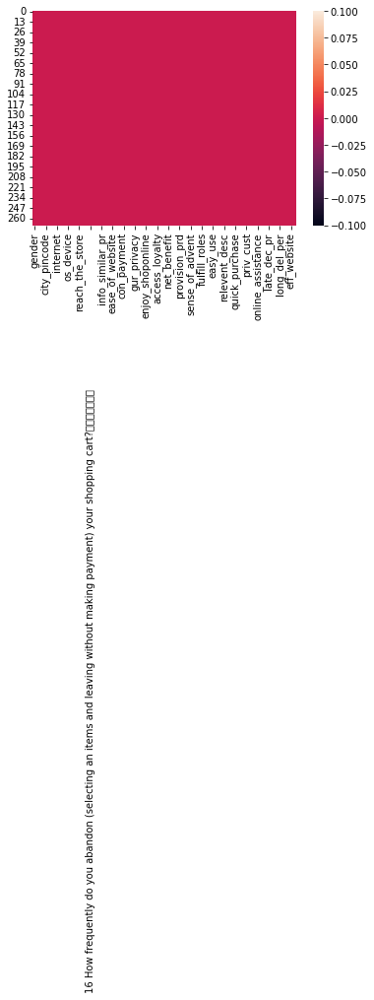

In [60]:
sns.heatmap(df.isnull())

 From the heatmap we can see that no null values are present.

# Statistical Summary

In [61]:
df.describe()

,city_pincode
count,269.000000
mean,220465.747212
std,140524.341051
min,110008.000000
25%,122018.000000
50%,201303.000000
75%,201310.000000
max,560037.000000


# Univariate Analysis

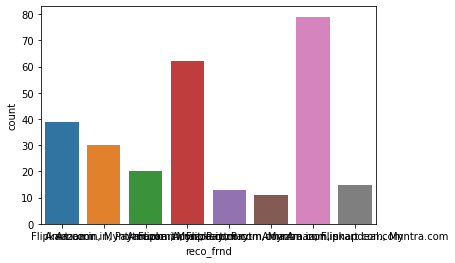

In [62]:
# Let's check the proportion of each type of income.
sns.countplot(x='reco_frnd',data=df)
plt.show()

In [63]:
# another example of univariate analysis
df['gender'].plot.box()

TypeError: no numeric data to plot

In [64]:
df['how_old'].plot.box()

TypeError: no numeric data to plot